# <span style="font-family:Roboto"> Bias in CelebA </span>

<span style="font-family:Roboto"> **Author** - [Vuong NGUYEN](https://github.com/XuanMinhVuongNGUYEN) </span>

- <span style="font-family:Roboto"> [**The CelebFaces Attributes Dataset (CelebA)**](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) is a large-scale face attributes dataset with more than 200K celebrity images, each with 40 attribute annotations. </span>
- <span style="font-family:Roboto"> Since we'll be placing ourselves in the **fairness** framework, we're going to attack the Male/Female binary classification problem, in which we'll explore bias based on celebrity hair color. As we will demonstrate later, this group of images constitutes a discriminatory group in the sense of the equality of errors. We will calculate some statistics about the dataset in the next section. </span>

# <span style="font-family:Roboto; color:#002E63"> Imports </span>

<span style="font-family:Roboto"> We import the necessary libraries and tools. </span>

In [1]:
import numpy as np
import pandas as pd
from PIL import Image as PilImage
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from utils_plot import plot_res_celeba_global, plot_best_res_celeba, plot_res_celeba_minority

# <span style="font-family:Roboto; color:#002E63"> Exploring CelebA </span>

## <span style="font-family:Roboto; color:#FF3800"> Raw dataset </span>

<span style="font-family:Roboto"> Let's take a look at the distribution of the number of male and female based on different hair colors present in the raw dataset. </span>

In [2]:
df_attr = pd.read_csv('/home/vuong.nguyen/vuong/augmentare/Bias Celeba/dataset/list_attr_celeba.csv')

In [3]:
df_attr.replace(-1,0,inplace=True)
data = df_attr[['image_id', 'Male', 'Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Gray_Hair']]

data_male = data[data["Male"]==1]
data_female = data[data["Male"]==0]

arr=pd.DataFrame(data_male.iloc[:,2:].sum(axis=0))
arr.columns=['Male']

arr1=pd.DataFrame(data_female.iloc[:,2:].sum(axis=0))
arr1.columns=['Female']
result = pd.concat([arr, arr1], axis=1)

In [4]:
fig = go.Figure()
x = ['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Gray_Hair']

fig.add_trace(go.Bar(
    name='Male',
    x=x, y=result.Male))

fig.add_trace(go.Bar(
    name='Female',
    x=x, y=result.Female))

fig.update_layout(title="Number of men and women on different hair colors in raw dataset", yaxis_title="Number", barmode="group")
fig.show()

<span style="font-family:Roboto"> We can see a big difference in the number of male and female images in blond and gray hair colors in the raw dataset. For example, the blond female has 28234 images which is very large compared to the blond male having 1749 images, which is **93.8% smaller**. And the gray male with 7235 images is quite large compared to the gray female having 1264 images, which is **82.52% smaller**. This shows that the blond hair male and the gray hair female account for a very small percentage of the CelebA dataset. </span>

## <span style="font-family:Roboto; color:#FF3800"> Train dataset </span>

<span style="font-family:Roboto"> We remove the hairless cases in the raw dataset and split the images into train, test, and validation sets at 70%, 15%, and 15% respectively. Let's see if this new train set exhibits the same bias as the raw dataset. </span>

- <span style="font-family:Roboto"> For specific steps to process the dataset please see the the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> </span>

In [5]:
train_df = pd.read_csv('/home/vuong.nguyen/vuong/augmentare/Bias Celeba/dataframe_dataset/train_df.csv')
data = train_df

In [6]:
data_male = data[data["Male"]==1]
data_female = data[data["Male"]==0]

arr=pd.DataFrame(data_male.iloc[:,2:6].sum(axis=0))
arr.columns=['Male']

arr1=pd.DataFrame(data_female.iloc[:,2:6].sum(axis=0))
arr1.columns=['Female']
result = pd.concat([arr, arr1], axis=1)

In [7]:
fig = go.Figure()
x = ['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Gray_Hair']

fig.add_trace(go.Bar(
    name='Male',
    x=x, y=result.Male))

fig.add_trace(go.Bar(
    name='Female',
    x=x, y=result.Female))

fig.update_layout(title="Number of men and women on different hair colors in train dataset", yaxis_title="Number", barmode="group")
fig.show()

<span style="font-family:Roboto"> We clearly see that this new train set presents the same setting (significant disparity in the number of male and female in blond and gray hair colors) as the raw dataset, thus we can use it to keep on our experiments. </span>

# <span style="font-family:Roboto; color:#002E63"> Baseline (ResNet18) </span>

<span style="font-family:Roboto"> To evaluate if the presence of the minority groups highlighted previously creates a bias in the learning of an AI model we take a ResNet18 model as a baseline model for comparison of error rates between groups. </span>

- <span style="font-family:Roboto"> For specific steps to make this work with ResNet18 model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

In [8]:
error_rate_baseline = np.load(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_ResNet18/Baseline/error_rate_seed.npy")
err_rate = error_rate_baseline

In [9]:
fig = make_subplots(rows=1, cols=3, subplot_titles=("Combination", "Hair Color", "Sex"))
x = ['Black', 'Blond', 'Brown', 'Gray']
x_sex = ['Male', 'Female']

fig.add_trace(go.Bar(
    name='Male',
    x=x, y=err_rate[:4]), row=1, col=1)

fig.add_trace(go.Bar(
    name='Female',
    x=x, y=err_rate[4:8]), row=1, col=1)

fig.add_trace(go.Bar(
    name="Hair Color",
    x=x, y=err_rate[8:12]), row=1, col=2)

fig.add_trace(go.Bar(
    name="Sex",
    x=x_sex, y=err_rate[12:]), row=1, col=3)

fig.update_layout(title="Error rate of image groups (Baseline)", yaxis_title="Error rate", barmode="group")
fig.show()

<span style="font-family:Roboto"> We find that minority image groups such as blond male and gray female have a significantly higher error rate than their gray male and blond female counterparts. This is exactly as we would expect, minority groups suffer from a significant error rate bias. </span>

# <span style="font-family:Roboto; color:#002E63"> Data Augmentation </span>

<span style="font-family:Roboto"> So the question is how to handle this bias. One way to solve this problem is to implement Data Augmentation methods by creating new images of the minority groups, then adding the augmented images to the original dataset and retraining the model. In this work, we investigated several Data Augmentation approaches to evaluate their ability to mitigate the bias. Next subsections introduce the different methods we used on the CelebA dataset.</span>

## <span style="font-family:Roboto; color:#FF3800"> Oversampling </span>
- <span style="font-family:Roboto"> Oversampling is a technique in machine learning used to address class imbalance. It involves increasing the number of instances in the minority groups by generating synthetic samples or replicating existing ones. This aims to balance the distribution of classes in the training dataset, which can improve the performance of machine learning models, particularly in binary classification tasks. </span>

- <span style="font-family:Roboto"> In this case, we use the Oversampling method to replicate the images of minorities `(blond hair male and gray hair female)` into the original dataset. We will replicate the images of the minority group into the original dataset until this minority group reaches the percentage of 5%, 10%,... compared to the total number of images of the class to be predicted `(male and female)` in the dataset for our task. In summary, Oversampling increases the representativeness of the minority group like `blond hair male and gray hair female`. </span>

## <span style="font-family:Roboto; color:#FF3800"> Undersampling </span>
- <span style="font-family:Roboto"> Undersampling is another technique used to mitigate class imbalance in machine learning datasets. It focuses on reducing the number of instances in the majority group to balance it with the minority group. This is typically done by randomly removing examples from the majority group. Undersampling can help prevent models from being biased toward the majority group and can improve their ability to recognize the minority group. </span>

- <span style="font-family:Roboto"> In this case, we use the Undersampling method to randomly removing the images of the majority group `(male and female)` from the original dataset until the minority group `(blond hair male and gray hair female)` reach the ratio 5%, 10%,... compared to the total number of images of the class to be predicted `(male and female)` in the dataset for our task. In summary, Oversampling reduces the representativeness of the majority group. </span>

## <span style="font-family:Roboto; color:#FF3800"> Change hair color </span>

<span style="font-family:Roboto"> Another approach is to create new images of minorities from images of the majority. In this family of methods we focused on changing the hair's color of an individual from a majority group into a hair's color so this individual belong to the minority group. Specifically, here we focus on transforming:
    <ul> <li> <span style="font-family:Roboto; color:gold"> gray hair male to blond hair male </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> blond hair female to gray hair female </span> </li> </ul> 
</span>

<span style="font-family:Roboto"> We mainly used the following methods:
    <ul> <li> <span style="font-family:Roboto; color:gold"> Traditional method is supported by OpenCV tools </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> CUT model </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> CycleGAN model </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Diffusion model </span> </li> </ul>
</span>

### <span style="font-family:Roboto; color:#0BDA51"> Classic (Traditional method is supported by OpenCV tools) </span>

- <span style="font-family:Roboto"> One approach consist of modifying the hair color of an individual solely based on "traditional" computer vision's tools. In this step, we used the tools available in the OpenCV library. In order to do this we will use the hair segmentation technique to get the hair mask from the image of the characters and then change the hair color with the help of the hair mask. To do hair segmentation we use the [Mediapipe](https://developers.google.com/mediapipe/solutions/vision/image_segmenter) library, and to change hair color first we have to define the RGB index of color we want, then we use `cv2.threshold` and `cv2. addWeighted` functions of OpenCV to do it. Also, we can use an alpha variable to control the level of hair color change in the function `cv2.addWeighted`. Let's see some examples below. </span>

- <span style="font-family:Roboto"> For specific steps to make this work, please see the tutorial here: <img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> </span>

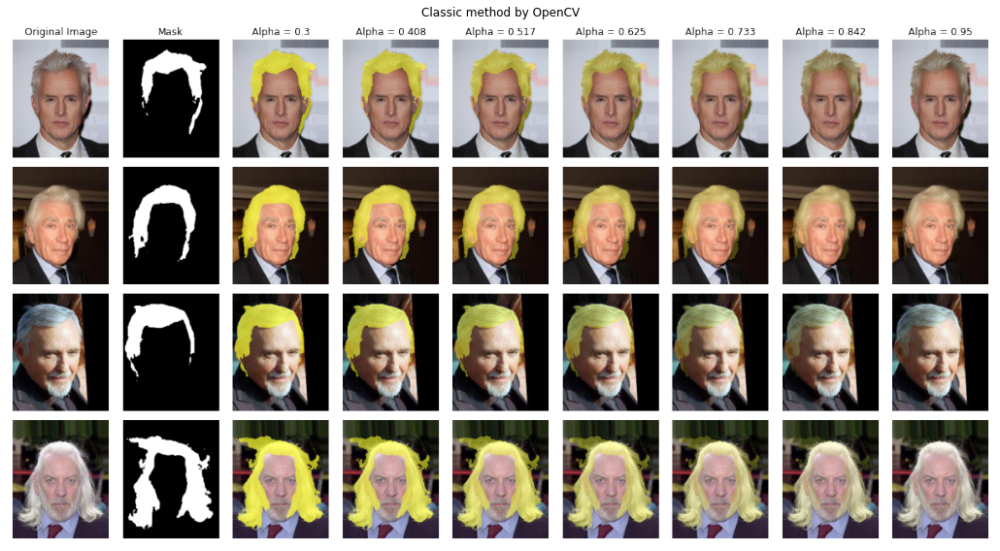

In [10]:
fig = plt.figure(figsize=(20,8))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Classic/male_blond_classic.png")
plt.imshow(img)
plt.axis("off")
plt.title("Classic method by OpenCV")
fig.tight_layout()
fig.show()

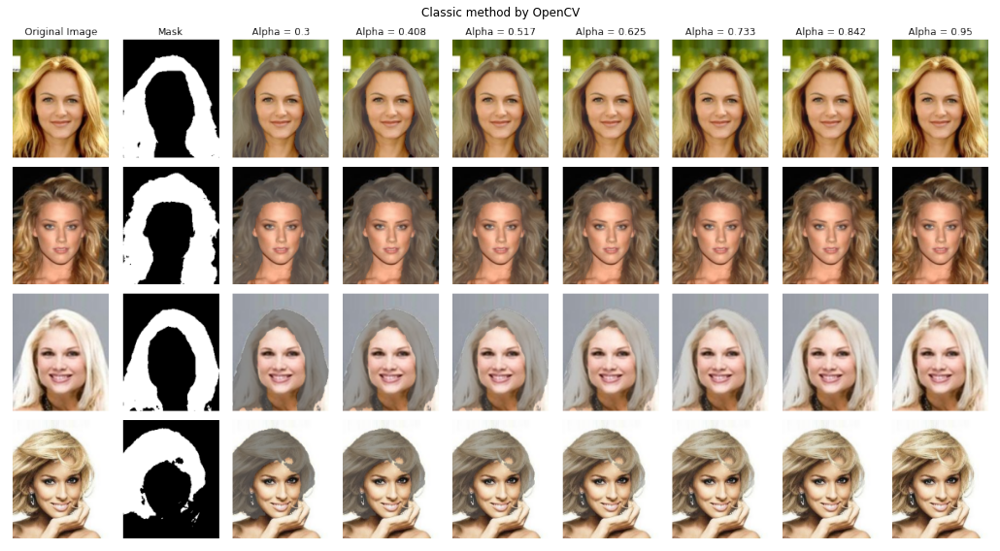

In [11]:
fig = plt.figure(figsize=(20,8))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Classic/female_gray_classic.png")
plt.imshow(img)
plt.axis("off")
plt.title("Classic method by OpenCV")
fig.tight_layout()
fig.show()

<span style="font-family:Roboto"> We see that different alpha values give different level of hair colors. It depends on the hair color that we want to change will have different appropriate alpha values. For example for blond hair color we choose `alpha=0.842` and for gray hair color we choose `alpha=0.408` to create new images. </span>

### <span style="font-family:Roboto; color:#0BDA51"> CUT + CycleGAN </span>

<span style="font-family:Roboto"> Another way to do hair color change is to use CUT and CycleGAN models: </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> CUT: </span> <span style="font-family:Roboto"> Contrastive Learning for Unpaired Image-to-Image Translation is a technique in the field of computer vision and image processing. This technique focuses on addressing the problem of unpaired image-to-image translation, which involves converting an image from one domain to another without having a one-to-one correspondence between the images in the source and target domains. The key idea behind contrastive learning in this context is to learn a shared representation space for images from different domains (e.g., photos and paintings) such that similar images from different domains are close together in this space, while dissimilar images are far apart. This learned representation can then be used to perform image translation between the domains, even when you don't have exact pairs of corresponding images. </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> CycleGAN: </span> <span style="font-family:Roboto"> Cycle-Consistent Adversarial Networks is a type of deep learning model and framework used for unsupervised image-to-image translation. CycleGAN is designed for scenarios where you have two sets of images from different domains and you want to learn a mapping between them without requiring paired examples. In other words, it enables you to perform transformations between two domains without the need for one-to-one correspondence between images in those domains. </span> </li> </ul>

<span style="font-family:Roboto">
Here we use the CUT and CycleGAN models from the <a href="https://github.com/jolibrain/joliGEN/tree/master">JoliGEN</a> library and the CycleGAN model that we implemented in Augmentare. We need to create a dataset of two folders, one containing the images with the hair color we want to change (trainA) and another containing the images with the hair color we are aiming for ( trainB).
</span>

- <span style="font-family:Roboto"> For specific steps to make this work with CUT model (JoliGEN), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2007.15651) </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CycleGAN model (JoliGEN), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/1703.10593) </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CycleGAN model (Augmentare), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/1703.10593) </span>

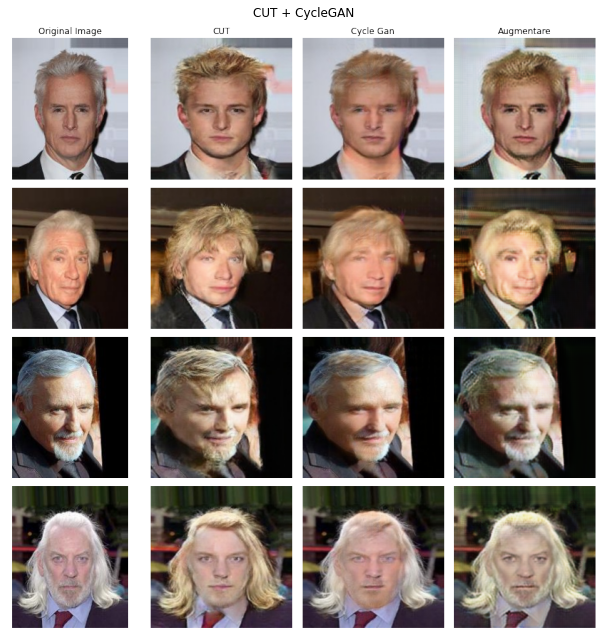

In [12]:
fig = plt.figure(figsize=(9,9))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Hair color/male_blond.png")
plt.imshow(img)
plt.axis("off")
plt.title("CUT + CycleGAN")
fig.tight_layout()
fig.show()

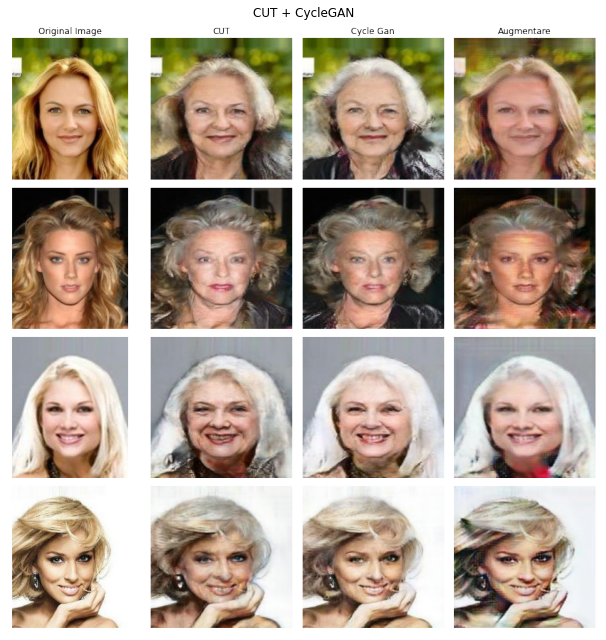

In [13]:
fig = plt.figure(figsize=(9,9))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Hair color/female_gray.png")
plt.imshow(img)
plt.axis("off")
plt.title("CUT + CycleGAN")
fig.tight_layout()
fig.show()

<span style="font-family:Roboto"> We see that all models work well and produce good quality images. JoliGEN's CUT and CycleGAN models sometimes change the face, not just the hair color. Augmentare's CycleGAN model only changes hair color. </span>

### <span style="font-family:Roboto; color:#0BDA51"> Diffusion model </span>

<span style="font-family:Roboto"> Another interesting approach is to use the diffusion model, here we use the DDPM model from the [JoliGEN](https://github.com/jolibrain/joliGEN/tree/master) library. </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> Denoising Diffusion Probabilistic Models (DDPMs) </span> <span style="font-family:Roboto"> represent a class of generative models that provide a novel approach to synthesizing high-quality images. Particularly in the realm of image-to-image generation, such as inpainting and super-resolution, DDPMs exhibit excellent performance and results. </span> </li>
    <li> <span style="font-family:Roboto"> In the arena of generative models, DDPMs have emerged as a strong contender to the likes of GANs and Variational Autoencoders (VAEs). The key principle behind DDPMs is the transformation of a simple noise distribution into a complex data distribution via a diffusion process that gradually adds or removes details over time. </span> </li> </ul>

<img src="/home/vuong.nguyen/vuong/augmentare/Bias Celeba/imgs/ddpm_principle.png" width=500 alt="Picture" style="display: block; margin: 0 auto" />
    <ul> <li> <span style="font-family:Roboto"> The model essentially learns the data distribution of images, and through the gradual diffusion process, it can transform a noisy or incomplete image into a clean, detailed one. </span> </li>
    <img src="/home/vuong.nguyen/vuong/augmentare/Bias Celeba/imgs/ddpm_inpainting.png" width=600 alt="Picture" style="display: block; margin: 0 auto" />
    <li> <span style="font-family:Roboto"> The significance of DDPMs in image-to-image tasks cannot be understated. The quality of the generated images is often superior to those from traditional GAN-based or VAE-based models. Furthermore, DDPMs have a more stable and easier-to-train architecture, which is another reason for their growing popularity. </span> </li> </ul>
<img src="/home/vuong.nguyen/vuong/augmentare/Bias Celeba/imgs/ddpm_car_samples.png" width=600 alt="Picture" style="display: block; margin: 0 auto" />

<span style="font-family:Roboto"> We need to create a dataset consisting of two directories `trainA` and `testA`. Each of these folder contains: </span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> imgs: </span> <span style="font-family:Roboto"> the original images </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> mask: </span> <span style="font-family:Roboto"> the masks for the hair area </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> paths.txt: </span> <span style="font-family:Roboto"> the pairs image/mask used for training/testing </span> </li> </ul>

<span style="font-family:Roboto"> To get the mask of the hair we use the hair segmentation technique by the [Mediapipe](https://developers.google.com/mediapipe/solutions/vision/image_segmenter) library. </span>

- <span style="font-family:Roboto"> For specific steps to create dataset, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the DDPM model (JoliGEN), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

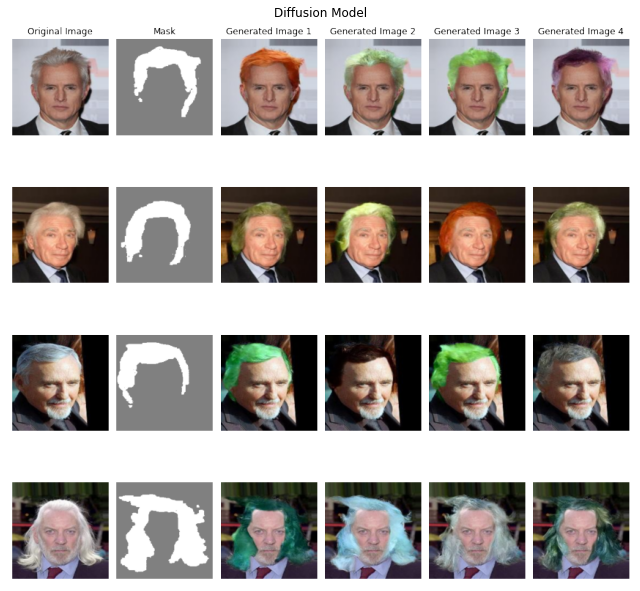

In [14]:
fig = plt.figure(figsize=(9,9))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Diffusion/diffusion_hair_color.png")
plt.imshow(img)
plt.axis("off")
plt.title("Diffusion Model")
fig.tight_layout()
fig.show()

<span style="font-family:Roboto"> We found that the DDPM model worked well and produced high quality images. However, the problem here is that it is difficult to control the hair color generated, so we temporarily do not use it for our experiments. </span>

## <span style="font-family:Roboto; color:#FF3800"> Change face </span>

<span style="font-family:Roboto"> During our experiments we also tried another approach that consist on changing the face of an individual in order to change its gender. Specifically, the augmentation we tried here were:</span>
- <span style="font-family:Roboto"> Change the face of a blond hair female so that the new image is a blond hair male</span>
- <span style="font-family:Roboto"> Change the face of a gray hair male so that the new image is a gray hair female</span>

### <span style="font-family:Roboto; color:#0BDA51"> CUT + CycleGAN </span>

<span style="font-family:Roboto"> Here we use the CUT and CycleGAN models from the [JoliGEN](https://github.com/jolibrain/joliGEN/tree/master) library and the CycleGAN model that we programmed in Augmentare. We need to create a dataset consisting of two folders, one containing the images with the face we want to change (trainA) and another containing the facial images we are aiming for (trainB).  </span>

- <span style="font-family:Roboto"> For specific steps to make this work with CUT model (JoliGEN), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2007.15651) </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CycleGAN model (JoliGEN), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/1703.10593) </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the CycleGAN model (Augmentare), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/1703.10593) </span>

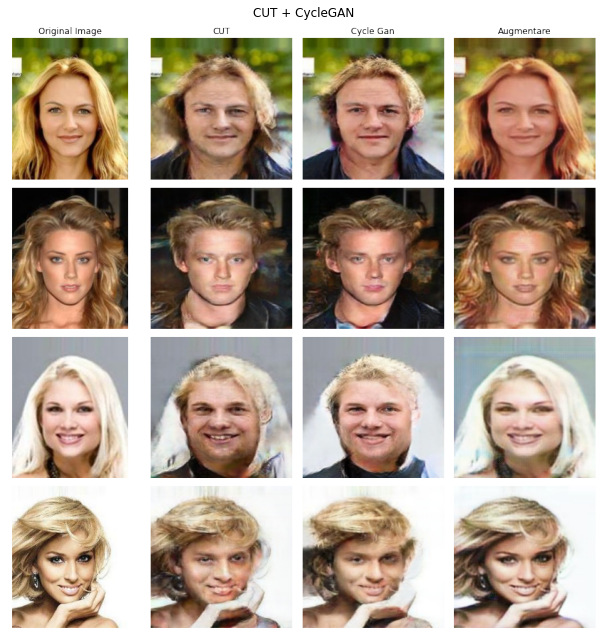

In [15]:
fig = plt.figure(figsize=(9,9))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Face/male_blond.png")
plt.imshow(img)
plt.axis("off")
plt.title("CUT + CycleGAN")
fig.tight_layout()
fig.show()

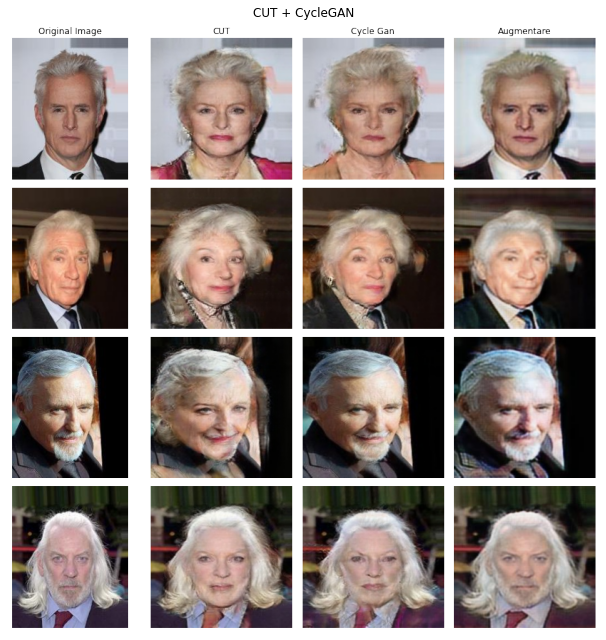

In [16]:
fig = plt.figure(figsize=(9,9))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Face/female_gray.png")
plt.imshow(img)
plt.axis("off")
plt.title("CUT + CycleGAN")
fig.tight_layout()
fig.show()

<span style="font-family:Roboto"> We found that all models performed well and produced good-quality images. JoliGEN's CUT and CycleGAN models did a great job in converting the gender of the individual in the image, in fact, it added the desired gender properties such as makeup, lips... The CycleGAN model of Augmentare doesn't work well in this case. Therefore we will use CUT and CycleGAN models of JoliGEN to perform the face transformation task. </span>

### <span style="font-family:Roboto; color:#0BDA51"> Diffusion model </span>

<span style="font-family:Roboto"> Another interesting approach is to use the diffusion model to insert an alternate face through a mask around the face, here we use the DDPM model from the [JoliGEN](https://github.com/jolibrain/joliGEN/tree/master) library. We need to create a dataset consisting of two directories `trainA` and `trainB`. Each of these folder contains:
    <ul> <li> <span style="font-family:Roboto; color:gold"> imgs: </span> <span style="font-family:Roboto"> the original images </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> bbox: </span> <span style="font-family:Roboto"> contains a .txt file per image, that lists the boxes of face area of an individual and a mask .jpg file for the face area </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> paths.txt: </span> <span style="font-family:Roboto"> list of associated source image/bbox file </span> </li> </ul>
    
<span style="font-family:Roboto"> To get the bbox and face mask of the images, we use the Face Detection technique to create the bbox then use the bbox to create the mask for the face area.</span>
    <ul> <li> <span style="font-family:Roboto; color:gold"> Face Detection: </span> <span style="font-family:Roboto"> We tested the Face Detection methods such as: SSD, DFSDD, RNMV, RNRN50, MP then compared the accuracy of the face area and their calculation time. We choose the best method as `RNMV` to conduct our experiments. </span> </li> </ul>

<span style="font-family:Roboto"> Bounding boxes are elements location in format: `cls xmin ymin xmax ymax` where `cls` is the id of image. </span>

- <span style="font-family:Roboto"> For specific steps to create dataset, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the DDPM model (JoliGEN), please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

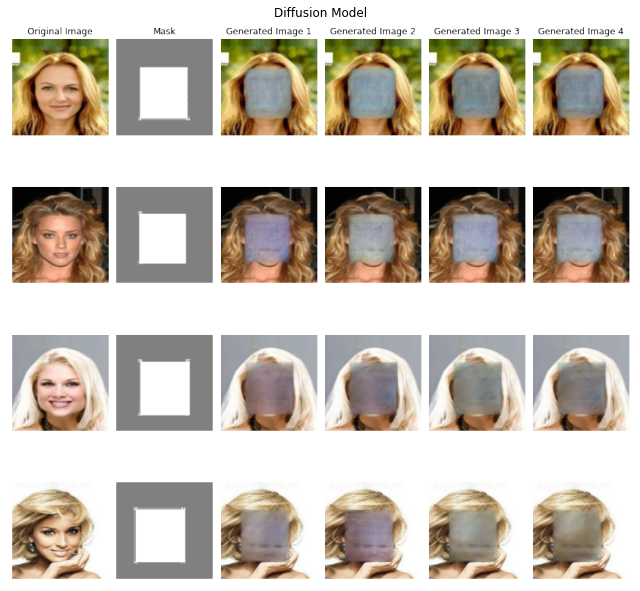

In [17]:
fig = plt.figure(figsize=(9,9))
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/Diffusion/diffusion_face.png")
plt.imshow(img)
plt.axis("off")
plt.title("Diffusion Model")
fig.tight_layout()
fig.show()

<span style="font-family:Roboto"> We found that the DDPM model did not work in this case. Therefore we temporarily do not use it for our experiments. </span>

## <span style="font-family:Roboto; color:#FF3800"> Other GAN models </span>

### <span style="font-family:Roboto; color:#0BDA51"> DCGAN + ProGAN </span>

<span style="font-family:Roboto"> We also tried DCGAN and ProGAN but we felt that the quality of the images generated was insufficient, moreover, it would have been necessary to generate a lot of images, then select them by hand according to the group of the image to be created. This seems to add an "overlay" quality that pushes us to set aside these approaches as part of our experiments. </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the DCGAN model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

- <span style="font-family:Roboto"> We continue to try using another ProGAN model included in Augmentare to generate new images. They work fine and generate the images randomly. However, the image quality produced is not too good, so we did not choose the DCGAN and ProGAN models to perform our experiments. </span>

- <span style="font-family:Roboto"> For specific steps to make this work with the ProGAN model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

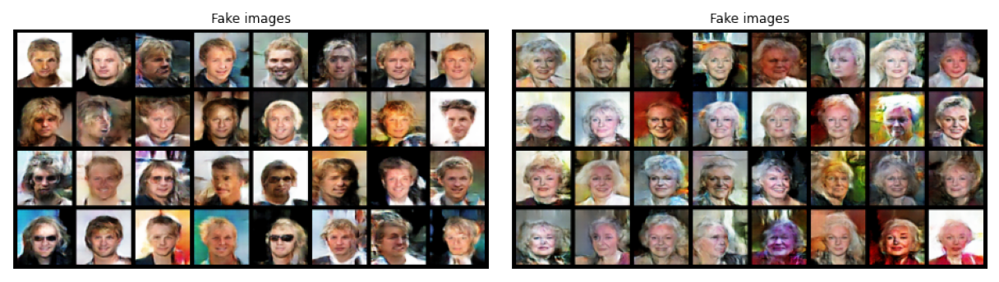

In [18]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/DCGAN/male_blond.png")
ax1.imshow(img)
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/DCGAN/female_gray.png")
ax2.imshow(img)
ax2.axis("off")

fig.tight_layout()
fig.show()

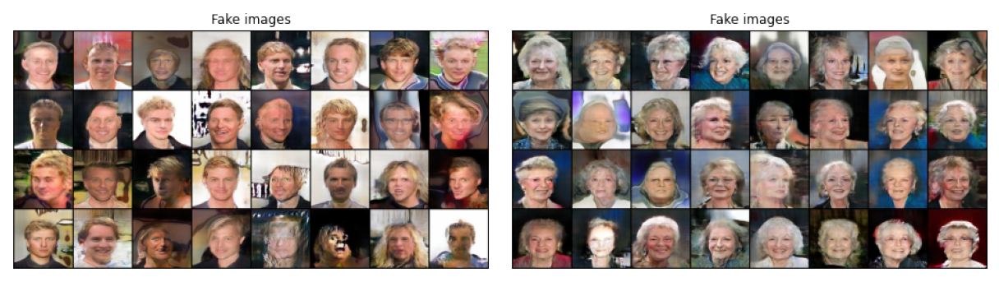

In [19]:
fig = plt.figure(figsize=(17,5))

ax1 = fig.add_subplot(1, 2, 1)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/ProGAN/male_blond.png")
ax1.imshow(img)
ax1.axis("off")

ax2 = fig.add_subplot(1, 2, 2)
img = PilImage.open(f"/home/vuong.nguyen/vuong/augmentare/Bias Celeba/Outputs_DA/ProGAN/female_gray.png")
ax2.imshow(img)
ax2.axis("off")

fig.tight_layout()
fig.show()

# <span style="font-family:Roboto; color:#002E63"> Results of the experiments </span>

<span style="font-family:Roboto"> After identifying useful Data Augmentation methods, we proceed to create new fake images and then add them to the original dataset and re-train the model and evaluate the results. After obtaining new minority images from the Data Augmentation methods, we add them to the original dataset until the number of minority classes accounts for 5%, 10%, 15%... with its parent image class. For example we add so that the number of blond hair male images accounts for 5%, 10%, 15% of the total number of male images, same for female. For each Data Augmentation method we perform the redistribution of the dataset with three experiments:
    <ul> <li> <span style="font-family:Roboto; color:gold"> Only male: </span> <span style="font-family:Roboto"> redistributing only male images i.e. only adding blond hair male images to the original dataset </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Only female: </span> <span style="font-family:Roboto"> redistributing only female images i.e. only adding gray hair female images to the original dataset </span> </li>
    <li> <span style="font-family:Roboto; color:gold"> Both: </span> <span style="font-family:Roboto"> redistributing both male and female images i.e. only adding both blond hair male and gray hair female images images to the original dataset </span> </li> </ul>
</span>

- <span style="font-family:Roboto"> For specific steps to generate data by Classic method (OpenCV) and train ResNet18 model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

- <span style="font-family:Roboto"> For specific steps to generate data by CUT_face (JoliGEN) and train ResNet18 model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

- <span style="font-family:Roboto"> For specific steps to generate data by CUT_hair_color (JoliGEN) and train ResNet18 model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

- <span style="font-family:Roboto"> For specific steps to generate data by CycleGAN (Augmentare) and train ResNet18 model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

- <span style="font-family:Roboto"> For specific steps to generate data by CycleGAN_face (JoliGEN) and train ResNet18 model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

- <span style="font-family:Roboto"> For specific steps to generate data by CycleGAN_face (JoliGEN) and train ResNet18 model, please see the tutorial here:
<img src="https://colab.research.google.com/assets/colab-badge.svg"> <a href=""> View colab tutorial </a> | <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href=""> View source </a> | 📰 [Paper](https://arxiv.org/abs/2111.05826) </span>

<span style="font-family:Roboto; color:navy"> Below we will plot the error rates of all image groups with Data Augmentation methods in the same figure for easy comparison. The horizontal dashed lines are the baseline of the image groups. </span>

## <span style="font-family:Roboto; color:#FF3800"> Only redistribute gray female images </span>

In [3]:
df_female = pd.read_csv('dataframe_metrics/resnet18_female.csv')

In [4]:
plot_res_celeba_global(df=df_female, mode_redis="gray female", save_path = None)

In [6]:
plot_best_res_celeba(df=df_female, mode_redis="gray female", best_method="CyGAN_face/5", save_path = None)

In [5]:
plot_best_res_celeba(df=df_female, mode_redis="gray female", best_method="Over/15", save_path = None)

- <span style="font-family:Roboto"> To determine which Data Augmentation method gives the best results, we will determine which method makes the error rates of different hair colors the most balanced for both male and female. </span>

- <span style="font-family:Roboto"> In the case of redistribution only gray female image, we find that the CycleGAN_face/5 method achieves the best balance in terms of error rates between hair colors for male, however for female, it does not achieve the balance desired. However, in order to achieve a balance in error rates between male hair color groups, they must have a trade-off, namely, the black, red, and brown hair groups have a higher error rate than the baseline to find the balance. </span>

- <span style="font-family:Roboto"> Therefore, based on good criteria for both male and female, the method with the best results is Oversampling/15. We see that most of the columns are below the baseline. However, there is still a trade-off in the gray hair male group. But this trade-off for more balance between groups of male's hair. </span>

## <span style="font-family:Roboto; color:#FF3800"> Only redistribute blond male images </span>

In [7]:
df_male = pd.read_csv('dataframe_metrics/resnet18_male.csv')

In [8]:
plot_res_celeba_global(df=df_male, mode_redis="blond male", save_path = None)

In [9]:
plot_best_res_celeba(df=df_male, mode_redis="blond male", best_method="CyGAN_hair/10", save_path = None)

- <span style="font-family:Roboto"> Same as above, in the case of redistributing only blond male images, the method that achieves the best results is CycleGAN_hair_color/10. We see that for male we achieve a good balance. In the female class, however, we see that there is a trade-off, namely that the brown, black and blond hair color classes have a higher error rate than the baseline. But this trade-off for more balance between groups of female's hair.</span>

## <span style="font-family:Roboto; color:#FF3800"> Redistribution both gray female and blond male images </span>

In [10]:
df_total = pd.read_csv('dataframe_metrics/resnet18_total.csv')

In [11]:
plot_res_celeba_global(df=df_total, mode_redis="both gray female and blond male", save_path = None)

In [12]:
plot_best_res_celeba(df=df_total, mode_redis="both gray female and blond male", best_method="CUT_hair/15", save_path = None)

In [13]:
plot_best_res_celeba(df=df_total, mode_redis="both gray female and blond male", best_method="Over/15", save_path = None)

- <span style="font-family:Roboto"> For the case of redistributing both male and female images at the same time, the two methods that achieve the best results are Oversampling/15 and CUT_hair/15. The two methods do not differ much in the balance between classes, method with better balance is CUT_hair/15. Furthermore, in terms of trade-offs, the Oversampling/15 method has more classes with higher error rates than the baseline than the CUT_hair/15 method. So in this case, CUT_hair/15 is the best method. </span>

- <span style="font-family:Roboto"> From the above cases, it is clear that in the case of redistributing only the number of male or female images, the results are sometimes even better than in the case of redistributing both at the same time. Therefore we should combine the redistribution of both male and female images with different proportions to get better results. </span>

# <span style="font-family:Roboto; color:#002E63"> Conclusions </span>

<span style="font-family:Roboto"> In this notebook we explored how to identify the minority groups present in the CelebA dataset and see how they bias AI models. </span>

<span style="font-family:Roboto"> We have also implemented data augmentation methods for the minority groups that are blond hair male and gray hair female images. We perform a lot of different approaches to getting more minority images. Methods include Oversampling, Undersampling, Change Hair Color and Change Face. </span>

<span style="font-family:Roboto"> We also set up an experiment to see which DA method worked best for correcting minorities. We run an experiments to see what percentage of minority images should be added to the original data for the best results. We have a few points to keep in mind: </span>

- <span style="font-family:Roboto"> It is worth noting here that Baseline is quite strong, it reaches *Acc* about *98%*. We can aim to do something more complex than binary classification. </span>

- <span style="font-family:Roboto"> In case of redistributing only gray female images, the best method is Oversampling/15. </span>

- <span style="font-family:Roboto"> In case of redistributing only blond male images, the best method is CycleGAN_hair_color/10. </span>

- <span style="font-family:Roboto"> In the case of redistributing both gray female and blond male images, the best method is CUT_hair_color/15.
 </span>

 - <span style="font-family:Roboto"> Therefore, in general, the DA methods do not improve the bias much more than the Oversampling method. However, we can combine DA methods on male and female images with different enhancement ratios, which can achieve better results. Because we can see that, in the case of redistributing only male or female images, the result is sometimes better than distributing both at the same time. </span>

- <span style="font-family:Roboto"> We can also study other strong biases that affect balance such as age and skin tone. </span>

<span style="font-family:Roboto; color:#FF3800"> Limitations: </span>

- <span style="font-family:Roboto"> This task has not been tested much on different models. This is done only with pre-trained models. Moreover this experiment is only done with one baseline. Should try more baselines in the future. </span>

- <span style="font-family:Roboto"> Have not trained the models many times with different seed values to see if the error rates of the groups are stable. </span>